<a href="https://www.kaggle.com/code/thirumani/shark-tank-australia-data-analysis?scriptVersionId=174910926" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

## <p style="background-color:blue;color:white;font-size:24px;text-align:center;border-radius:10px 10px;font-weight:bold;border:2px solid #800080;">SharkTank Australia Exploratory Data Analysis (EDA)</p>
## Dataset https://www.kaggle.com/datasets/thirumani/shark-tank-australia-dataset

In [1]:
from IPython.display import IFrame
import datetime
print("Notebook was last executed on:", datetime.date.today().strftime("%Y-%b-%d"), "with Python version")
!python --version

Notebook was last executed on: 2024-Apr-30 with Python version
Python 3.10.13


In [2]:
# Source: Wikipedia
IFrame('https://upload.wikimedia.org/wikipedia/en/5/50/Shark_Tank_Australia_logo.png', width=310, height=210)

## ⚒️ Importing Required Python Libraries

In [3]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)

import matplotlib.pyplot as plt
import seaborn as sns
from babel.numbers import format_currency
from wordcloud import WordCloud, STOPWORDS
import geopandas as gpd
import plotly.express as px
import plotly.io as pio
pio.templates.default = "plotly_dark"
pio.renderers.default = 'notebook'

## ⏳ Check and import dataset

In [4]:
! ls -l /kaggle/input/shark-tank-australia-dataset/
shark_tank = pd.read_csv('/kaggle/input/shark-tank-australia-dataset/Shark Tank Australia dataset.csv')

nRow, nCol = shark_tank.shape
print(f'\nThere are {nRow} rows and {nCol} columns in the dataset')

total 56
-rw-r--r-- 1 nobody nogroup 56523 Apr 30 15:06 'Shark Tank Australia dataset.csv'

There are 237 rows and 52 columns in the dataset


## 💵 Exploratory Data Analysis (EDA)

In [5]:
shark_tank.head(5)

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Equity Per Shark,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present
0,1,CricketCooler,1,1,8-Feb-15,7-Jun-15,8-Feb-15,Fitness/Sports/Outdoors,An esky with attached cricket stumps,NaN,NaN,NaN,NaN,NaN,Adam Dubrich & Leigh Warren,1,"616,000",280000,20.0,1400000,1,1.0,280000.0,20.0,1400000.0,...,20.0,NaN,NaN,200000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,280000.0,20.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN
1,1,RentResumé,1,2,8-Feb-15,7-Jun-15,8-Feb-15,Software/Tech,Online rental subscription that details rental...,NaN,NaN,NaN,NaN,NaN,Darren Smith,0,"616,000",2500000,40.0,6250000,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN
2,1,CaseBoards,1,3,8-Feb-15,7-Jun-15,8-Feb-15,Electronics,"Portable, electric remote controlled skateboar...",NaN,NaN,NaN,NaN,NaN,Adam Riley,0,"616,000",20000,10.0,200000,1,1.0,40000.0,35.0,114286.0,...,17.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20000.0,17.5,20000.0,17.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN
3,1,Hamdog,1,4,8-Feb-15,7-Jun-15,8-Feb-15,Food and Beverage,hamburger and hot dog combination,NaN,NaN,NaN,NaN,NaN,Mark Murray,0,"616,000",1,25.0,4,1,1.0,2.0,50.0,4.0,...,50.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,50.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN
4,1,EdibleBugShop,2,5,8-Feb-15,7-Jun-15,15-Feb-15,Business Services,Edible insect business selling ground cricket ...,NaN,NaN,NaN,NaN,NaN,Skye Blackburn,0,"688,000",170000,20.0,850000,1,1.0,170000.0,50.0,340000.0,...,50.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,170000.0,50.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN


In [6]:
shark_tank.tail(10).T

,227,228,229,230,231,232,233,234,235,236
Season Number,5,5,5,5,5,5,5,5,5,5
Startup Name,Mearth,EasyTattInc,CinnamonCove,35MMCo,SockDrawerHeroes,HolidayCelebrationTrees,Brandscent,GetDown,Fydoo,Nevabuds
Episode Number,5,6,6,7,7,7,8,8,8,8
Pitch Number,230,232,233,236,237,238,240,241,242,243
Season Start,29-Aug-23,29-Aug-23,29-Aug-23,29-Aug-23,29-Aug-23,29-Aug-23,29-Aug-23,29-Aug-23,29-Aug-23,29-Aug-23
Season End,17-Oct-23,17-Oct-23,17-Oct-23,17-Oct-23,17-Oct-23,17-Oct-23,17-Oct-23,17-Oct-23,17-Oct-23,17-Oct-23
Original Air Date,26-Sep-23,3-Oct-23,3-Oct-23,10-Oct-23,10-Oct-23,10-Oct-23,17-Oct-23,17-Oct-23,17-Oct-23,17-Oct-23
Industry,Automotive/Vehicles,Fashion/Beauty,Fashion/Beauty,Lifestyle/Home,Fashion/Beauty,Business Services,Business Services,Lifestyle/Home,Pet Products,Software/Tech
Business Description,e-scooter,Temporary tattoos,Swimwear brand for tweens,Coffee Table Photo Album,Gender expression company,"Seasonal, space-saving Christmas trees",Scent-based marketing and psychology,Selling condoms marketed to women,Self-Cleaning Dog Toilet,Invention that will keep earbuds together
Company Website,https://www.mearth.com.au/,https://www.easytatt.com.au/,https://cinnamoncove.com.au/,https://35mmco.com/,https://sockdrawerheroes.com/,https://holidaycelebrationtrees.com/,https://www.brandscent.com.au/,https://getdown.com.au/,https://fydoo.com/,https://nevabuds.com.au/


In [7]:
shark_tank['Season Number'] = shark_tank['Season Number'].astype(pd.Int32Dtype())
shark_tank['Episode Number'] = shark_tank['Episode Number'].astype(pd.Int32Dtype())
shark_tank['Pitch Number'] = shark_tank['Pitch Number'].astype(pd.Int32Dtype())

shark_tank['Startup Name'] = shark_tank['Startup Name'].astype(str)
shark_tank['Industry'] = shark_tank['Industry'].astype(str)
shark_tank['Business Description'] = shark_tank['Business Description'].astype(str)

shark_tank['Multiple Entrepreneurs'] = shark_tank['Multiple Entrepreneurs'].astype(pd.Int32Dtype())

shark_tank['Viewers'] = shark_tank['Viewers'].str.replace(',','')
shark_tank['Viewers'] = pd.to_numeric(shark_tank['Viewers'])

In [8]:
shark_tank.sample(10).style.set_properties(**{"background-color": "#2a9d8f","color":"white","border": "1px solid black", 'font-size': '10pt'})

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,Investment Amount Per Shark,Equity Per Shark,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present
25,1,KLite,6,26,8-Feb-15,7-Jun-15,15-Mar-15,Fitness/Sports/Outdoors,A dynamo light for bicycles,nan,nan,nan,nan,nan,Kerry Staite,0,973000,50000,25.000000,200000,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,nan,1.000000
212,4,BirthBeat,13,213,15-May-18,7-Aug-18,7-Aug-18,Children/Education,Online birth education site,nan,nan,nan,nan,nan,Edwina Sharrock,0,371000,200000,10.000000,2000000,1,1.000000,200000.000000,20.000000,1000000.000000,1.000000,200000.000000,20.000000,nan,nan,100000.000000,nan,nan,nan,nan,200000.000000,20.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,1.000000,nan
85,2,AutomatedFlaggers,6,86,8-May-16,7-Jul-16,8-Jun-16,Business Services,A signaling system that takes traffic signalers out of harms way,nan,nan,nan,nan,nan,Fred Keizer,0,625000,0,0.000000,0,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,1.000000,nan
190,4,RefreshMobileCarDetailing,7,191,15-May-18,7-Aug-18,26-Jun-18,Automotive,"An on-demand, car detailing service",nan,nan,nan,nan,nan,Harrison Lingard,0,658000,400000,20.000000,2000000,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,1.000000,nan
199,4,TheMasonBaker,9,200,15-May-18,7-Aug-18,10-Jul-18,Food and Beverage,Handmade jarcakes,nan,nan,nan,nan,nan,James Willis,0,534000,50000,15.000000,333333,1,1.000000,100000.000000,30.000000,333333.000000,2.000000,50000.000000,15.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,50000.000000,15.000000,nan,nan,50000.000000,15.000000,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,1.000000,nan
141,3,BeFitFood,8,142,20-Jun-17,19-Sep-17,15-Aug-17,Fitness/Sports/Outdoors,Meal plan programs for rapid weight loss,nan,nan,nan,nan,nan,Kate Save & Dr. Geoffrey Draper,1,464000,300000,20.000000,1500000,1,1.000000,300000.000000,33.300000,900901.000000,1.000000,300000.000000,33.300000,nan,nan,100000.000000,nan,nan,nan,nan,300000.000000,33.300000,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,1.000000,nan
45,1,Mobilyser,11,46,8-Feb-15,7-Jun-15,26-Apr-15,Software/Tech,An app that separates work related calls from personal calls for tax purposes,nan,nan,nan,nan,nan,Robbie Adams,0,480000,1000000,25.000000,4000000,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,nan,1.000000
52,1,Flexsil-Lid,13,53,8-Feb-15,7-Jun-15,17-May-15,Green/CleanTech,"Reusable, watertight lids for bain marie pans",nan,nan,nan,nan,nan,Albert David & Robin Fester,1,559000,300000,10.000000,3000000,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,nan,1.000000
225,5,Mimi&Co,5,228,29-Aug-23,17-Oct-23,26-Sep-23,Children/Education,Reusable baby nappies,https://mimiandco.com.au/,Female,Young,Canberra,

In [9]:
shark_tank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 237 entries, 0 to 236
Data columns (total 52 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Season Number                237 non-null    Int32  
 1   Startup Name                 237 non-null    object 
 2   Episode Number               237 non-null    Int32  
 3   Pitch Number                 237 non-null    Int32  
 4   Season Start                 237 non-null    object 
 5   Season End                   237 non-null    object 
 6   Original Air Date            237 non-null    object 
 7   Industry                     237 non-null    object 
 8   Business Description         237 non-null    object 
 9   Company Website              41 non-null     object 
 10  Pitchers Gender              23 non-null     object 
 11  Pitchers Average Age         23 non-null     object 
 12  Pitchers City                21 non-null     object 
 13  Pitchers State      

In [10]:
shark_tank.describe().T.round(2).style.background_gradient(cmap = 'Oranges')

,count,mean,std,min,25%,50%,75%,max
Season Number,237.000000,2.645570,1.315211,1.000000,1.000000,3.000000,4.000000,5.000000
Episode Number,237.000000,7.033755,3.896832,1.000000,4.000000,7.000000,10.000000,15.000000
Pitch Number,237.000000,119.265823,69.002648,1.000000,60.000000,119.000000,178.000000,243.000000
Multiple Entrepreneurs,237.000000,0.388186,0.488369,0.000000,0.000000,0.000000,1.000000,1.000000
Viewers,237.000000,553936.708861,146930.890745,216000.000000,464000.000000,571000.000000,646000.000000,973000.000000
Original Ask Amount,237.000000,289063.379747,498307.303892,0.000000,80000.000000,170000.000000,300000.000000,5000000.000000
Original Offered Equity,237.000000,17.108439,9.431947,0.000000,10.000000,15.000000,20.000000,51.000000
Valuation Requested,237.000000,2003148.409283,2674660.548834,0.000000,500000.000000,1000000.000000,2500000.000000,20000000.000000
Received Offer,237.000000,0.624473,0.485284,0.000000,0.000000,1.000000,1.000000,1.000000
Accepted Offer,148.000000,0.858108,0.350124,0.000000,1.000000,1.000000,1.000000,1.000000


In [11]:
# Unique values in each column
for col in shark_tank.columns:
    print("Number of unique values in", col, "-", shark_tank[col].nunique())

Number of unique values in Season Number - 5
Number of unique values in Startup Name - 237
Number of unique values in Episode Number - 15
Number of unique values in Pitch Number - 236
Number of unique values in Season Start - 5
Number of unique values in Season End - 5
Number of unique values in Original Air Date - 62
Number of unique values in Industry - 16
Number of unique values in Business Description - 237
Number of unique values in Company Website - 41
Number of unique values in Pitchers Gender - 4
Number of unique values in Pitchers Average Age - 2
Number of unique values in Pitchers City - 13
Number of unique values in Pitchers State - 5
Number of unique values in Entrepreneur Names - 236
Number of unique values in Multiple Entrepreneurs - 2
Number of unique values in Viewers - 60
Number of unique values in Original Ask Amount - 62
Number of unique values in Original Offered Equity - 34
Number of unique values in Valuation Requested - 91
Number of unique values in Received Offe

In [12]:
# Latest/current season data
shark_tank_recent = shark_tank.loc[(shark_tank['Season Number']==5)]

In [13]:
# Data set information
print(shark_tank['Season Number'].max(), "total seasons in Australia SharkTank\n")
print(shark_tank['Pitch Number'].max(), "#startups came for pitching \n")

5 total seasons in Australia SharkTank

243 #startups came for pitching 



Season Number    1   2   3   4  5
Episode Number  15  13  13  13  8


([], [])

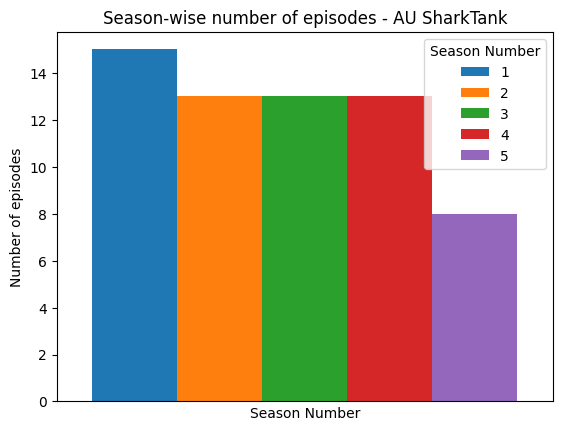

In [14]:
# Season-wise number of episodes
tmp = pd.pivot_table(shark_tank, values='Episode Number', columns='Season Number', aggfunc='max')
print(tmp)
tmp.plot(kind='bar', use_index=False, width=3.0)
plt.xlabel("Season Number")
plt.ylabel("Number of episodes")
plt.title("Season-wise number of episodes - AU SharkTank")
plt.xticks([])

In [15]:
# Season-wise number of pitches
tmp = shark_tank['Season Number'].value_counts().sort_values()
fig = px.bar(tmp, x=tmp.values, title="<b> Shark Tank Australia - Season-wise number of pitches</b>", template='plotly_white', text=tmp, width=580, height=440)
fig.update_yaxes(tickvals=list(range(6)))
fig.update_xaxes(visible=False)
fig.show()

In [16]:
# There were 3 to 5 pitches, in a each episode
print(shark_tank[['Season Number','Episode Number']].value_counts().sort_values(ascending=True).unique())

[1 2 3 4 5]


In [17]:
# Types of industries, came for investments, in all seasons
tmp = shark_tank['Industry'].value_counts().sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b> Shark Tank AU - Industry wise startups</b>", template='simple_white', text=tmp, width=850, height=700)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [18]:
# Types of industries, came for investment, in current/latest season (5th season)
tmp = shark_tank_recent['Industry'].value_counts().sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b> Australia Shark Tank in current/latest season (5th season) - Industry wise startups</b>", template='simple_white', text=tmp, width=850, height=450)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [19]:
# All seasons averages
pivot = pd.pivot_table(shark_tank, values=['Original Ask Amount','Total Deal Amount','Valuation Requested','Deal Valuation','Original Offered Equity','Total Deal Equity'], columns='Season Number', aggfunc=np.mean, sort=False)
pivot.style.format('{:.0f}')

Season Number,1,2,3,4,5
Original Ask Amount,295095,300000,225844,364510,214714
Total Deal Amount,148000,228438,279180,194714,139867
Valuation Requested,1962728,1861299,1937297,2270464,1979630
Deal Valuation,546832,1175094,1126014,984176,504004
Original Offered Equity,19,17,15,18,16
Total Deal Equity,36,23,36,24,32


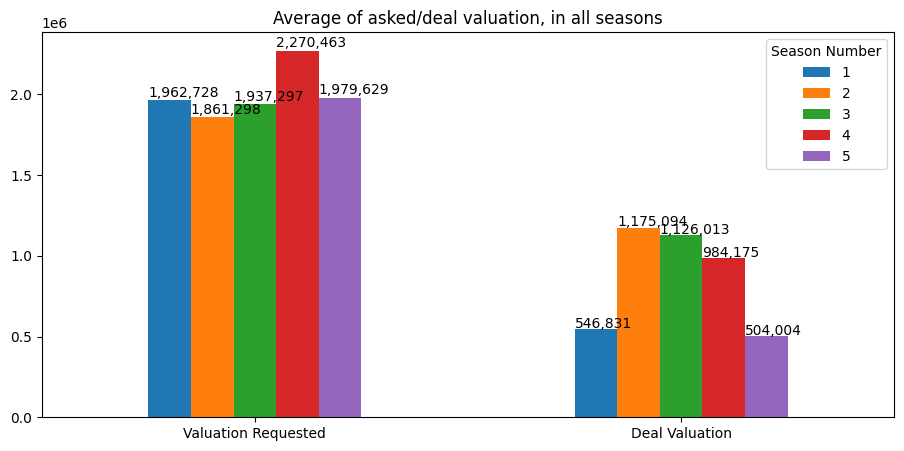

In [20]:
# All seasons average of offered/deal valuation
# plt.style.use('ggplot')
ax = pd.pivot_table(shark_tank, values=['Valuation Requested','Deal Valuation'], columns='Season Number', aggfunc=np.mean, sort=False).plot.bar(figsize=(11,5), title="Average of asked/deal valuation, in all seasons")
plt.xticks(rotation='horizontal')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

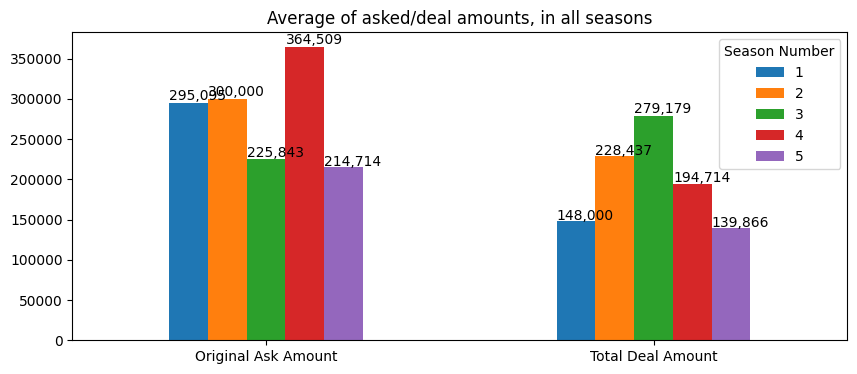

In [21]:
# All seasons average of offered/deal amounts
ax = pd.pivot_table(shark_tank, values=['Original Ask Amount','Total Deal Amount'], columns='Season Number', aggfunc=np.mean, sort=False).plot.bar(figsize=(10,4), title="Average of asked/deal amounts, in all seasons")
plt.xticks(rotation='horizontal')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

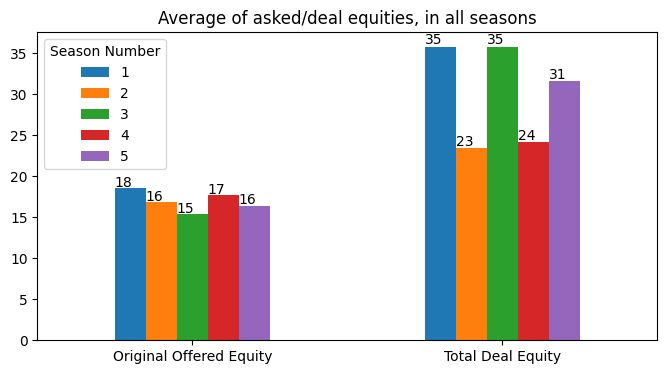

In [22]:
# All seasons average of offered/deal equities
ax = pd.pivot_table(shark_tank, values=['Original Offered Equity','Total Deal Equity'], columns='Season Number', aggfunc=np.mean, sort=False).plot.bar(figsize=(8,4), title="Average of asked/deal equities, in all seasons")
plt.xticks(rotation='horizontal')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

Pitchers Gender
Male          11
Female         8
Mixed Team     2
Couple         2
Name: count, dtype: int64 

Pitchers Gender
Male          48%
Female        35%
Mixed Team     9%
Couple         9%
Name: proportion, dtype: object 



Text(0, 0.5, '')

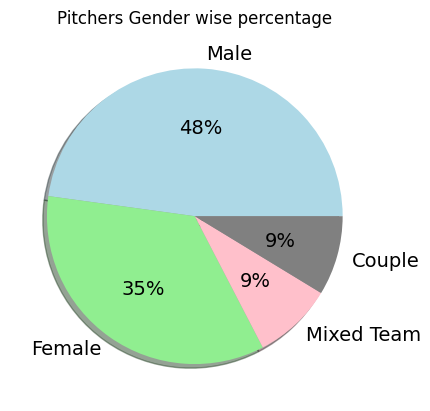

In [23]:
# Gender wise
print(shark_tank['Pitchers Gender'].value_counts(),"\n")

# In percentage
print(round(shark_tank['Pitchers Gender'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False),"\n")

plt.title("Pitchers Gender wise percentage")
shark_tank["Pitchers Gender"].value_counts().plot(kind='pie', autopct='%.0f%%', colors=["lightblue", "lightgreen", "pink", "gray"], shadow=True, fontsize=14)
plt.ylabel('')

## DATA INCOMPLETE

Pitchers Average Age
Middle    16
Young      7
Name: count, dtype: int64 

Pitchers Average Age
Middle    70%
Young     30%
Name: proportion, dtype: object 



Text(0, 0.5, '')

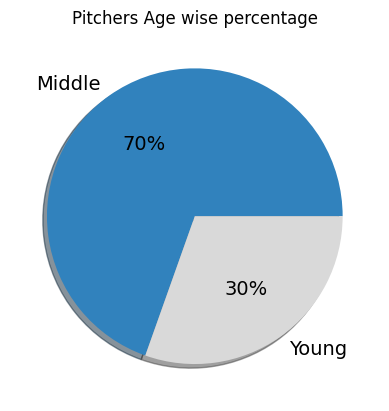

In [24]:
# Age wise
print(shark_tank['Pitchers Average Age'].value_counts(),"\n")

# In percentage
print(round(shark_tank['Pitchers Average Age'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False),"\n")

plt.title("Pitchers Age wise percentage")
shark_tank["Pitchers Average Age"].value_counts().plot(kind='pie', autopct='%.0f%%', cmap='tab20c', shadow=True, fontsize=14)
plt.ylabel('')

## DATA INCOMPLETE

### 💹 61% companies received offers and 39% startups could not convince Sharks to invest

Received Offer
1    148
0     89
Name: count, dtype: int64 

Received Offer
1    62%
0    38%
Name: proportion, dtype: object


Text(0, 0.5, '')

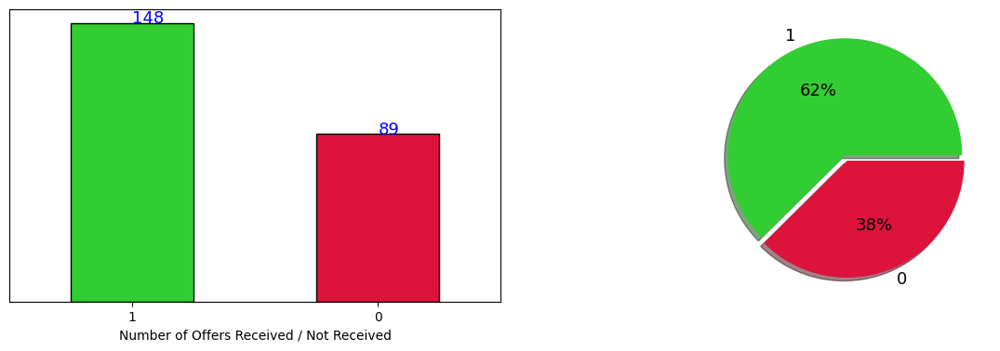

In [25]:
# Offers received
print(shark_tank['Received Offer'].value_counts(), "\n")
print(round(shark_tank['Received Offer'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15,9))
ax1 = plt.subplot(221)
shark_tank["Received Offer"].value_counts().plot(kind='bar', color=["limegreen","crimson"], ec="k")
plt.xlabel("Number of Offers Received / Not Received")
plt.yticks([])
plt.xticks(rotation=0)
for x,y in enumerate(shark_tank["Received Offer"].value_counts()):
    plt.annotate(y, (x,y), fontsize=13, color="blue")
    
ax2 = plt.subplot(222)
shark_tank["Received Offer"].value_counts().plot(kind='pie', autopct='%.0f%%', explode = (0,0.05), colors=["limegreen","crimson"], shadow=True, fontsize=13)
plt.ylabel('')

# 148 companies received offers & 89 startups could not convince #Sharks to invest.

### ＄ 85% companies accepted offers and 15% startups didn't accept Sharks offer


Accepted Offer
1.0    127
0.0     21
Name: count, dtype: int64 

Accepted Offer
1.0    86%
0.0    14%
Name: proportion, dtype: object


Text(0, 0.5, '')

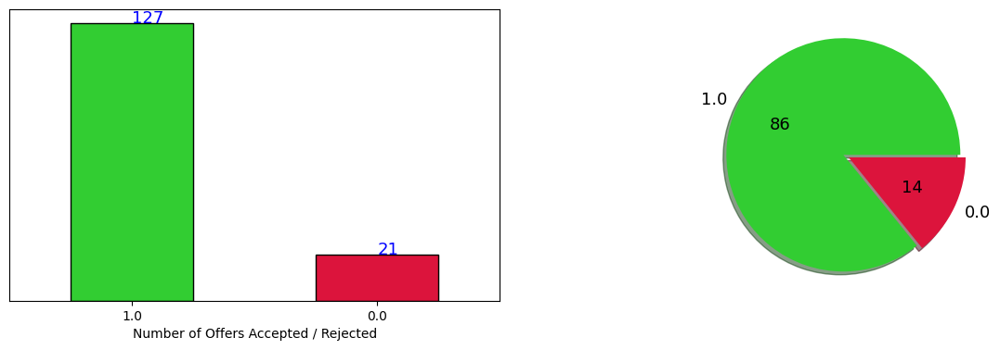

In [26]:
# Offers accepted
print(shark_tank['Accepted Offer'].value_counts(), "\n")
print(round(shark_tank['Accepted Offer'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15, 9))
ax1 = plt.subplot(221)
shark_tank["Accepted Offer"].value_counts().plot(kind='bar', color=["limegreen","crimson"], ec="k")
plt.xlabel("Number of Offers Accepted / Rejected")
plt.yticks([])
plt.xticks(rotation = 0)
for x,y in enumerate(shark_tank["Accepted Offer"].value_counts()):
    plt.annotate(y, (x,y), fontsize=13, color="blue")
    
ax2 = plt.subplot(222)
shark_tank["Accepted Offer"].value_counts().plot(kind='pie', autopct='%.0f', explode = (0,0.05), colors=["limegreen","crimson"], shadow=True, fontsize=13)
plt.ylabel('')

# 127 companies accepted investments they got & 21 #Startups did not accept Shark's offer.

In [27]:
# Offers rejected by pitchers/startup companies
print(shark_tank[shark_tank['Accepted Offer']==0]["Startup Name"].count())
shark_tank.loc[shark_tank['Accepted Offer']==0, ["Season Number","Startup Name","Industry","Original Ask Amount","Original Offered Equity"]]

21


,Season Number,Startup Name,Industry,Original Ask Amount,Original Offered Equity
9,1,Surfsafe,Fitness/Sports/Outdoors,120000,5.0
16,1,Expocentric,Business Services,2000000,10.0
29,1,ThePartyPeople,Business Services,400000,5.0
35,1,WeTeachMe,Children/Education,200000,2.5
44,1,Crisp,Food and Beverage,700000,10.0
64,2,CleverScore,Business Services,200000,25.0
66,2,Disrupt,Fitness/Sports/Outdoors,250000,5.8
75,2,OrmsbyGuitars,Lifestyle/Home,200000,10.0
103,2,Parkhound,Business Services,400000,10.0
105,2,Mup,Lifestyle/Home,300000,5.0


Pitchers Gender
Male          8
Female        7
Couple        2
Mixed Team    1
Name: count, dtype: int64


Text(0, 0.5, '')

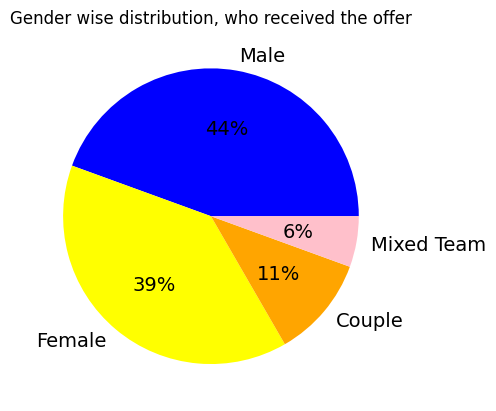

In [28]:
# Gender wise distribution, who received the offer
print(shark_tank[shark_tank['Received Offer']==1]['Pitchers Gender'].value_counts())
plt.title("Gender wise distribution, who received the offer")
shark_tank[shark_tank['Received Offer']==1]['Pitchers Gender'].value_counts().sort_values(ascending=False).plot.pie(autopct='%.0f%%',colors=["blue", "yellow", "orange", "pink"], fontsize=14)
plt.ylabel('')

## DATA INCOMPLETE

Pitchers Gender
Male          3
Female        1
Mixed Team    1
Name: count, dtype: int64


Text(0, 0.5, '')

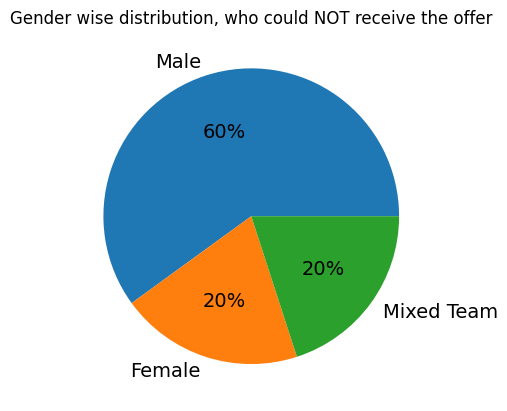

In [29]:
# Gender wise distribution, who could NOT receive the offer
print(shark_tank[shark_tank['Received Offer']==0]['Pitchers Gender'].value_counts())
plt.title("Gender wise distribution, who could NOT receive the offer")
shark_tank[shark_tank['Received Offer']==0]['Pitchers Gender'].value_counts().sort_values(ascending=False).plot.pie(autopct='%.0f%%', fontsize=14)
plt.ylabel('')

## DATA INCOMPLETE

## ❗ USA Shark Tank dataset Visualizations/infographics in Tableau Public —
### https://public.tableau.com/views/SharkTankUS/SharkTankUSStory_1

In [30]:
IFrame("https://public.tableau.com/views/SharkTankUS/SharkTankUSStory_1", width=1100, height=1100)

In [31]:
# Maximum amount requested
print("Maximum amount requested, by a pitcher -", format_currency(shark_tank['Original Ask Amount'].max(), 'AUD', locale='en_US').replace(".00", ""))

Maximum amount requested, by a pitcher - A$5,000,000


In [32]:
# Least amount requested
print("Least amount requested, by a pitcher -", format_currency(shark_tank['Original Ask Amount'].min(), 'AUD', locale='en_US').replace(".00", ""))

Least amount requested, by a pitcher - A$0


In [33]:
# Sum of investment amount asked, in Shark Tank Australia
print("Sum of investment amount asked, by all startup companies, in Australia Shark Tank -", format_currency(shark_tank['Original Ask Amount'].sum(), 'AUD', locale='en_US').replace(".00", ""))

Sum of investment amount asked, by all startup companies, in Australia Shark Tank - A$68,508,021


In [34]:
# Amount invested by all sharks, in Australia SharkTank
print("Amount invested by all sharks, in Shark Tank Australia -", format_currency(shark_tank['Total Deal Amount'].sum(), 'AUD', locale='en_US').replace(".00", ""))

Amount invested by all sharks, in Shark Tank Australia - A$26,229,032


In [35]:
# Sum of loan/debt amount, in Australian Shark Tank
print("Sum of loan/debt amount, given by all sharks, in Australian SharkTank -", format_currency(shark_tank['Loan'].sum(), 'AUD', locale='en_US').replace(".00", ""))

Sum of loan/debt amount, given by all sharks, in Australian SharkTank - A$3,235,000


In [36]:
# Top 15 investments, as per total investment/deal amount
print(shark_tank.groupby('Startup Name')['Total Deal Amount'].max().nlargest(15))

shark_tank['Total Deal Amount in Millions'] = shark_tank['Total Deal Amount']/1000000
tmpdf = shark_tank.sort_values('Total Deal Amount in Millions', ascending=False)[0:15]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Amount in Millions', color="Startup Name", title="Highest investment as per deal amount (in millions)", text=tmpdf['Total Deal Amount in Millions'].map(float).map(str))
fig.show()

# iCapsulate has biggest deal in #SharkTankAustralia history

Startup Name
iCapsulate          2500000.0
PaleoCafé            750000.0
OneWorld             700000.0
LilFairyDoors        650000.0
ScopeITEducation     632000.0
GanacheChocolate     600000.0
OnTheGoSports        600000.0
CancerAid            500000.0
TorqueSafe           500000.0
SharknadoAlive       475000.0
MiniPallets          400000.0
HegsPegs             380000.0
QPay                 380000.0
KidsCo               375000.0
ScrubbaWashBag       360000.0
Name: Total Deal Amount, dtype: float64


In [37]:
# Top 20 investments, as per total equity/shares percentage diluted
print(shark_tank.groupby('Startup Name')['Total Deal Equity'].max().nlargest(20))

tmpdf = shark_tank.sort_values('Total Deal Equity', ascending=False)[0:20]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Highest investment as per equity percentage", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

# 1 startup sold entire company (equity) to Sharks

Startup Name
Catch'N'Release           100.0
CharliChair                50.0
EctoHandPlanes             50.0
EdibleBugShop              50.0
Hamdog                     50.0
MelanieNewman              50.0
SharknadoAlive             50.0
Three65Underwear           50.0
TommySugo                  50.0
TorqueSafe                 50.0
HitWithME                  49.0
Nevabuds                   49.0
NevermindAdventure         49.0
SweetMickie                46.0
JimalieCoconutProducts     45.0
Koja                       45.0
Synxsole                   45.0
Deliciou                   44.0
10WayNecklace              40.0
Bottlepops                 40.0
Name: Total Deal Equity, dtype: float64


In [38]:
# Startups who sold 1/3rd of their company (equity) to Sharks
print(shark_tank.loc[shark_tank['Total Deal Equity'] == 33][["Startup Name"]].count())
print(shark_tank.loc[shark_tank['Total Deal Equity'] == 33][["Season Number","Startup Name", "Total Deal Equity"]])

tmpdf = shark_tank.loc[shark_tank['Total Deal Equity'] == 33]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Startups who sold 1/3rd of their company", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

Startup Name    7
dtype: int64
     Season Number     Startup Name  Total Deal Equity
38               1  TheDinnerLadies               33.0
113              2         OneWorld               33.0
122              3     HeyDayButter               33.0
146              3        JustJerky               33.0
203              4       SnapSocial               33.0
220              5         FireHalo               33.0
229              5     CinnamonCove               33.0


In [39]:
# Startups who got Debt/loan amount
print("Number of startups who got debt/loan amount", shark_tank['Loan'].count(),"\n")

shark_tank.loc[shark_tank['Loan'] >= 1][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity","Loan"]]

Number of startups who got debt/loan amount 25 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity,Loan
0,1,CricketCooler,280000.0,20.0,200000.0
11,1,MobileTyreShop,150000.0,10.0,100000.0
22,1,HegsPegs,380000.0,15.0,280000.0
32,1,TommySugo,350000.0,50.0,200000.0
36,1,CharliChair,200000.0,50.0,100000.0
39,1,GrownWoodenEyewear,60000.0,40.0,20000.0
47,1,Three65Underwear,120000.0,50.0,60000.0
50,1,Koja,150000.0,45.0,100000.0
55,1,HaloMedicalDevices,200000.0,21.0,100000.0
58,1,PiccaninnyTinyTots,40000.0,40.0,20000.0


In [40]:
# Startups who gave Royalty
print("Number of startups who gave Royalty", shark_tank['Royalty Deal'].count(),"\n")

shark_tank.loc[shark_tank['Royalty Deal'] >= 1][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]]

Number of startups who gave Royalty 7 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity
20,1,RescueSwag,100000.0,40.0
120,3,Catch'N'Release,200000.0,100.0
163,3,FreshMeals2U,200000.0,25.0
217,5,Stryda,50000.0,30.0
226,5,WuliGrooming,150000.0,40.0
232,5,HolidayCelebrationTrees,300000.0,30.0
234,5,GetDown,160000.0,40.0


## SharkTank America/USA statistics & data analysis https://kaggle.com/code/thirumani/shark-tank-us-data-analysis

In [41]:
# Startups who gave Advisory shares
print("Number of startups who gave Advisory shares/equity", shark_tank['Advisory Shares Equity'].count(),"\n")

shark_tank.loc[shark_tank['Advisory Shares Equity'] > 0][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity", "Advisory Shares Equity"]]

Number of startups who gave Advisory shares/equity 0 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity,Advisory Shares Equity


In [42]:
# Deals with conditions
print("Number of startups who accepted conditional deals", shark_tank['Deal Has Conditions'].count(),"\n")

shark_tank.loc[shark_tank['Deal Has Conditions'] == 'yes'][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]]

Number of startups who accepted conditional deals 5 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity
82,2,CapHat,120000.0,10.0
138,3,Cardly,250000.0,15.0
163,3,FreshMeals2U,200000.0,25.0
185,4,GanacheChocolate,600000.0,40.0
206,4,SpacetoCo,210000.0,21.0


In [43]:
# Startups who received Mentorship
print("Number of startups who got mentorship", shark_tank['Mentorship'].count(),"\n")

shark_tank.loc[shark_tank['Mentorship'].notnull()][["Season Number","Pitch Number","Startup Name","Mentorship"]]

Number of startups who got mentorship 8 



,Season Number,Pitch Number,Startup Name,Mentorship
120,3,121,Catch'N'Release,Naomi
123,3,124,ThePoleRoom,Janine
139,3,140,360Gym,"Steve,Glen"
143,3,144,BethanyGrace,Janine
159,3,160,CrookedCompass,Naomi
167,4,168,BistroMorgan,Janine
188,4,189,Gamify,Naomi
211,4,212,MinnowDesigns,Naomi


In [44]:
shark_tank.groupby('Mentorship')['Mentorship'].value_counts().sort_values(ascending=False)

# Naomi has offered Mentorship to more startups

Mentorship
Naomi         4
Janine        3
Steve,Glen    1
Name: count, dtype: int64

In [45]:
# # Gender/age wise pitchers combination
# shark_tank.groupby([shark_tank['Pitchers Gender'], shark_tank['Pitchers Average Age'], shark_tank['Multiple Entrepreneurs']]).size().nlargest(10)

# # Groups/Couples in middle age is most frequent combination followed by Male/Female in middle age

## 💰 Which shark invested most ?

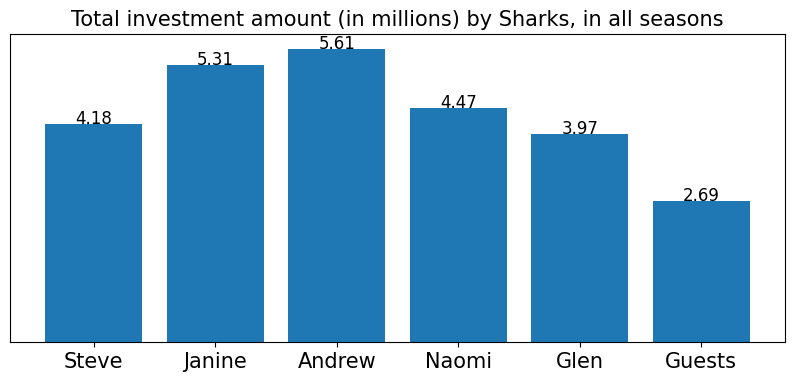

In [46]:
# Amount Invested by sharks
Amount = [(shark_tank['Steve Investment Amount']/1000000).sum(), (shark_tank['Janine Investment Amount']/1000000).sum(), (shark_tank['Andrew Investment Amount']/1000000).sum(), (shark_tank['Naomi Investment Amount']/1000000).sum(),
    (shark_tank['Glen Investment Amount']/1000000).sum(), (shark_tank['Guest Investment Amount']/1000000).sum()]
name=['Steve','Janine','Andrew','Naomi','Glen','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'])
plt.xticks(fontsize=15)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y=d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total investment amount (in millions) by Sharks, in all seasons", fontsize=15)
plt.show()

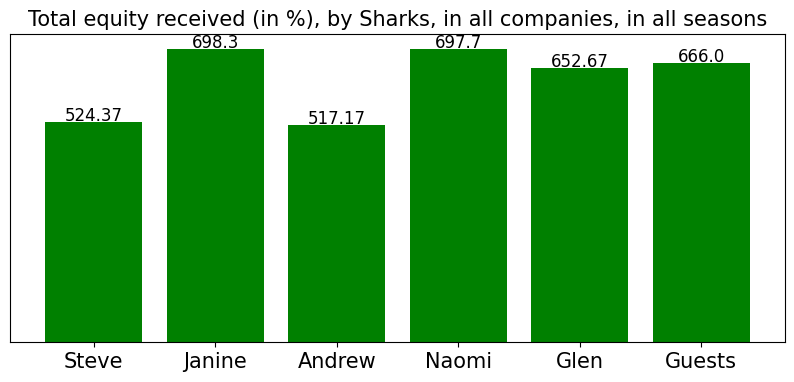

In [47]:
# Equity received by sharks, in all seasons
Equity = [shark_tank['Steve Investment Equity'].sum(), shark_tank['Janine Investment Equity'].sum(), shark_tank['Andrew Investment Equity'].sum(), shark_tank['Naomi Investment Equity'].sum(),
    shark_tank['Glen Investment Equity'].sum(), shark_tank['Guest Investment Equity'].sum()]
df = {'Name':name, 'Total Equity':Equity}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Equity'], color='g')
plt.xticks(fontsize=15)
plt.yticks([])
for index,d in enumerate(Equity):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total equity received (in %), by Sharks, in all companies, in all seasons", fontsize=15)
plt.show()

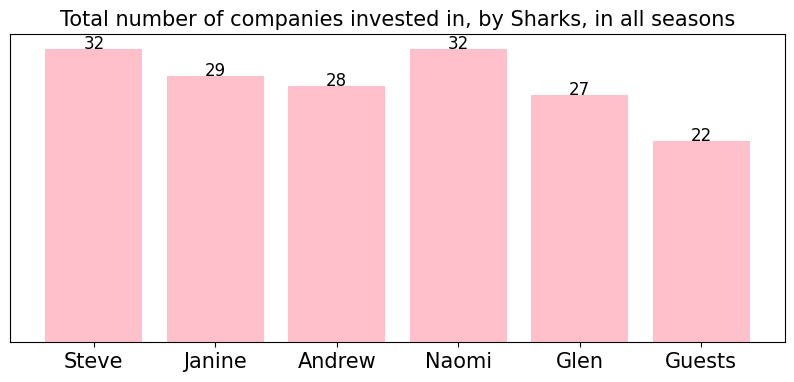

In [48]:
# Number of companies invested
Amount = [(shark_tank['Steve Investment Amount']).count(), (shark_tank['Janine Investment Amount']).count(), (shark_tank['Andrew Investment Amount']).count(), (shark_tank['Naomi Investment Amount']).count(),
    (shark_tank['Glen Investment Amount']).count(), (shark_tank['Guest Investment Amount']).count()]
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'], color='pink')
plt.xticks(fontsize=15)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y=d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total number of companies invested in, by Sharks, in all seasons", fontsize=15)
plt.show()

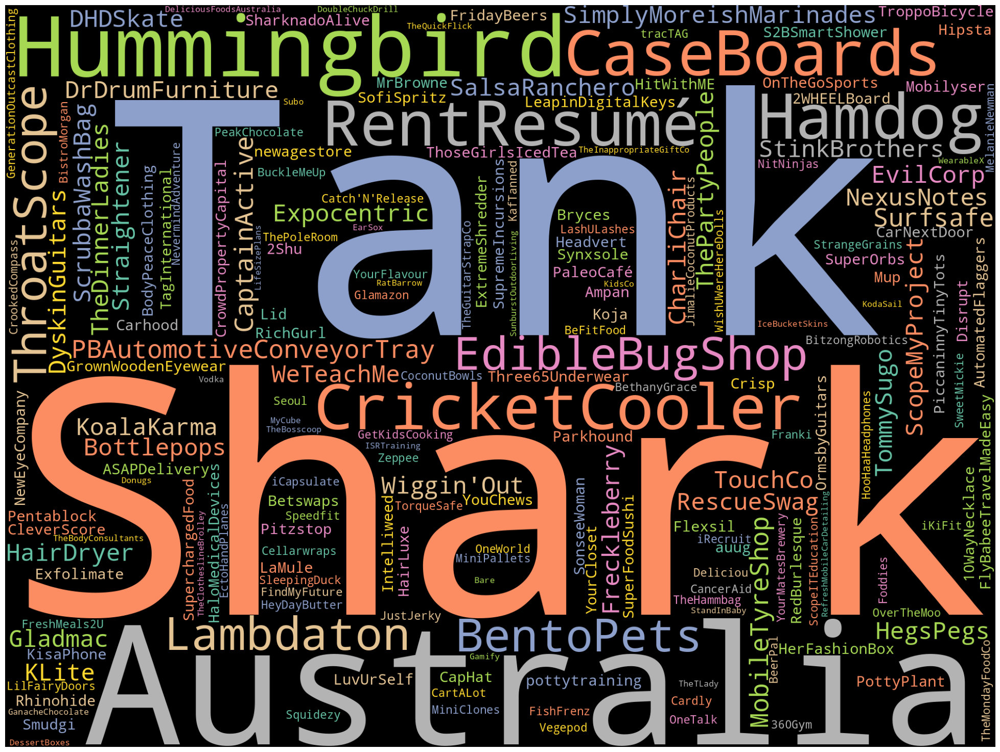

In [49]:
# Word cloud based on Startup Names, in all seasons
text = " Shark Tank Australia ".join(cat for cat in shark_tank['Startup Name'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='black', colormap='Set2', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

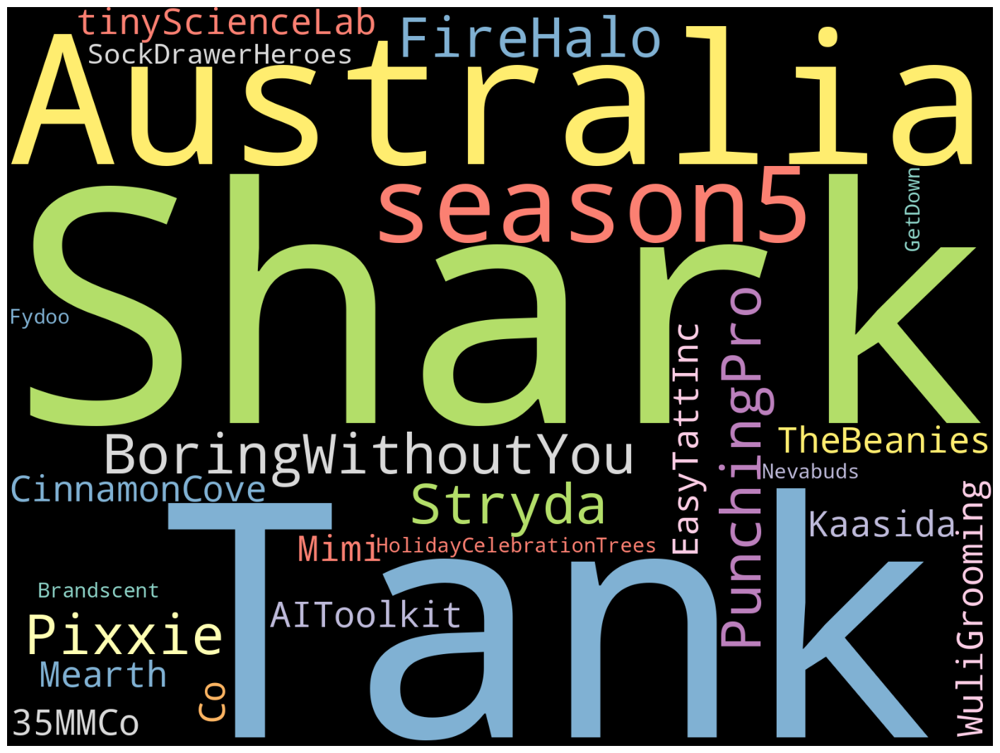

In [50]:
# Word cloud based on Startup Names, in current/latest season (5th season)
text = " Shark Tank Australia season5 ".join(cat for cat in shark_tank_recent['Startup Name'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=1600, height=1200, stopwords=stop_words, background_color='black', colormap='Set3', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(18,15))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

## 🔎 Shark Tank India Dataset https://www.kaggle.com/datasets/thirumani/shark-tank-india

## 🔥Steve's Investments

Total investments by Steve  32
Investment amount by Steve A$4,179,500
Equity received by Steve 524.37 % in different companies

Company details:
------------------------------------------------------------------------------------------
      Startup Name                Industry  Steve Investment Amount
       ThroatScope         Health/Wellness              76000.00000
    MobileTyreShop              Automotive              75000.00000
        RescueSwag          Lifestyle/Home             100000.00000
    ScrubbaWashBag             Electronics             180000.00000
        Bottlepops Fitness/Sports/Outdoors              75000.00000
      Hummingbirds      Children/Education              40000.00000
PiccaninnyTinyTots      Children/Education              20000.00000
 ThoseGirlsIcedTea       Food and Beverage              70000.00000
     OnTheGoSports Fitness/Sports/Outdoors             200000.00000
    SharknadoAlive     Media/Entertainment              95000.00000
       CarNextDo

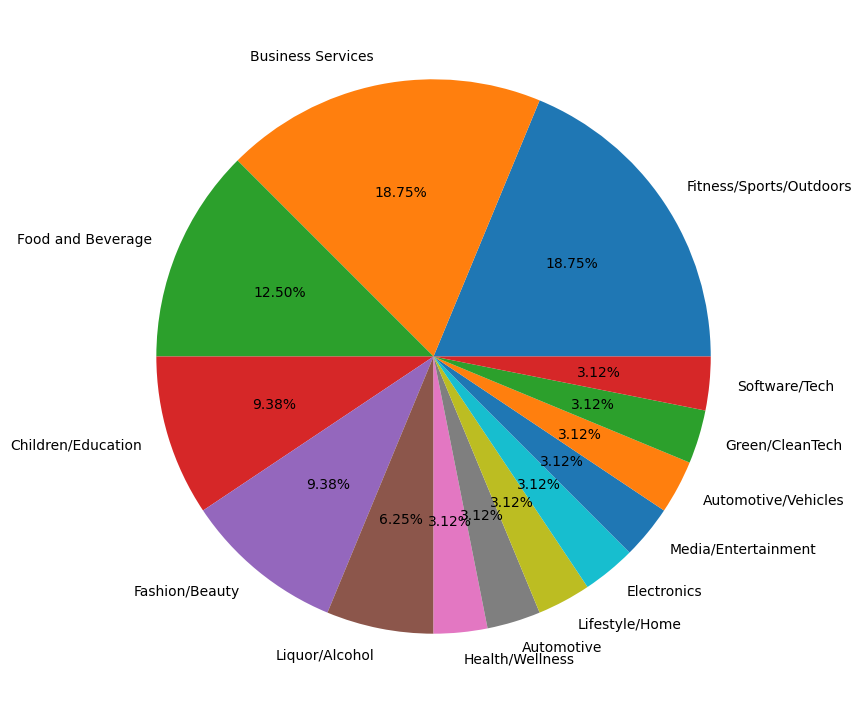

In [51]:
print("Total investments by Steve", shark_tank[shark_tank['Steve Investment Amount']>0][['Steve Investment Amount']].count().to_string()[-3:])
print("Investment amount by Steve", format_currency(shark_tank['Steve Investment Amount'].sum(), 'AUD', locale='en_US').replace(".00", ""))
print("Equity received by Steve", round(shark_tank['Steve Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Steve Investment Amount']>0][["Startup Name","Industry","Steve Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nSteve industry wise investments\n")
print(shark_tank[shark_tank['Steve Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Steve Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Steve Investment Amount']>0] [["Startup Name","Steve Investment Amount","Steve Investment Equity"]].sort_values(by="Steve Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Steve Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎇 Janine's Investments

Total investments by Janine  29
Investment amount by Janine A$5,306,000
Equity received by Janine 698.3 % in different companies

Company details:
------------------------------------------------------------------------------------------
           Startup Name                Industry  Janine Investment Amount
             CaseBoards             Electronics                   20000.0
          EdibleBugShop       Business Services                  170000.0
         ScrubbaWashBag             Electronics                  180000.0
              TommySugo       Food and Beverage                  350000.0
        TheDinnerLadies       Food and Beverage                  216000.0
 FlyBabeeTravelMadeEasy      Children/Education                   80000.0
       Three65Underwear          Fashion/Beauty                   60000.0
          OnTheGoSports Fitness/Sports/Outdoors                  200000.0
         SharknadoAlive     Media/Entertainment                   95000.0
          HerFashionBo

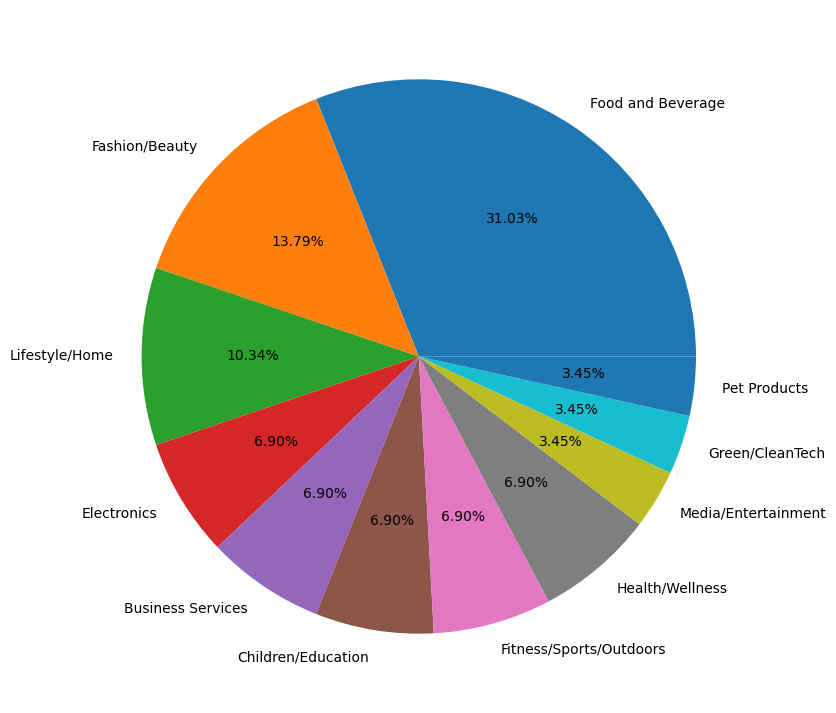

In [52]:
print("Total investments by Janine", shark_tank[shark_tank['Janine Investment Amount']>0][['Janine Investment Amount']].count().to_string()[-3:])
print("Investment amount by Janine", format_currency(shark_tank['Janine Investment Amount'].sum(), 'AUD', locale='en_US').replace(".00", ""))
print("Equity received by Janine", round(shark_tank['Janine Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Janine Investment Amount']>0][["Startup Name","Industry","Janine Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nJanine industry wise investments\n")
print(shark_tank[shark_tank['Janine Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Janine Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Janine Investment Amount']>0] [["Startup Name","Janine Investment Amount","Janine Investment Equity"]].sort_values(by="Janine Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Janine Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## ✳️ Andrew's Investments

Total investments by Andrew  28
Investment amount by Andrew A$5,606,517
Equity received by Andrew 517.17 % in different companies

Company details:
------------------------------------------------------------------------------------------
      Startup Name                Industry  Andrew Investment Amount
        CaseBoards             Electronics              2.000000e+04
            Hamdog       Food and Beverage              2.000000e+00
        Bottlepops Fitness/Sports/Outdoors              7.500000e+04
          Synxsole          Fashion/Beauty              1.000000e+05
HaloMedicalDevices         Health/Wellness              1.000000e+05
     OnTheGoSports Fitness/Sports/Outdoors              2.000000e+05
    SharknadoAlive     Media/Entertainment              9.500000e+04
     HerFashionBox          Fashion/Beauty              1.000000e+05
         Rhinohide              Automotive              4.000000e+04
            CapHat          Fashion/Beauty              6.000000e+04
  

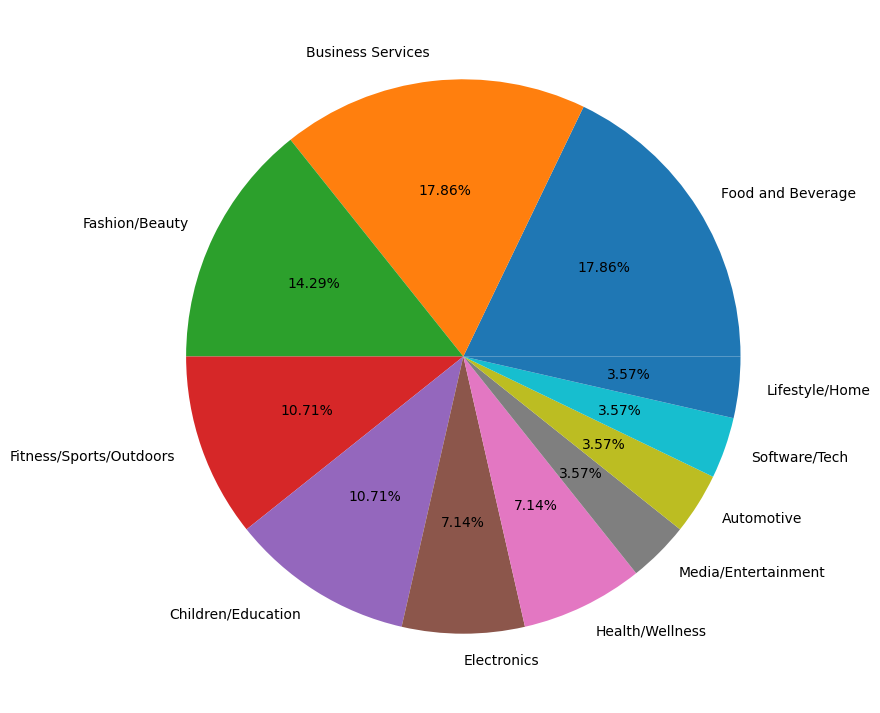

In [53]:
print("Total investments by Andrew", shark_tank[shark_tank['Andrew Investment Amount']>0][['Andrew Investment Amount']].count().to_string()[-3:])
print("Investment amount by Andrew", format_currency(shark_tank['Andrew Investment Amount'].sum(), 'AUD', locale='en_US').replace(".00", ""))
print("Equity received by Andrew", round(shark_tank['Andrew Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Andrew Investment Amount']>0][["Startup Name","Industry","Andrew Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nAndrew industry wise investments\n")
print(shark_tank[shark_tank['Andrew Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Andrew Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Andrew Investment Amount']>0] [["Startup Name","Andrew Investment Amount","Andrew Investment Equity"]].sort_values(by="Andrew Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Andrew Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🚀 Naomi's Investments

Total investments by Naomi  32
Investment amount by Naomi A$4,470,015
Equity received by Naomi 697.7 % in different companies

Company details:
------------------------------------------------------------------------------------------
           Startup Name                Industry  Naomi Investment Amount
          CricketCooler Fitness/Sports/Outdoors                 280000.0
               HegsPegs          Lifestyle/Home                 380000.0
     GrownWoodenEyewear          Lifestyle/Home                  30000.0
       Three65Underwear          Fashion/Beauty                  60000.0
     HaloMedicalDevices         Health/Wellness                 100000.0
            SonseeWoman          Fashion/Beauty                 100000.0
         SharknadoAlive     Media/Entertainment                  95000.0
       TagInternational Fitness/Sports/Outdoors                  50000.0
        ExtremeShredder Fitness/Sports/Outdoors                  50000.0
             YourCloset          Fa

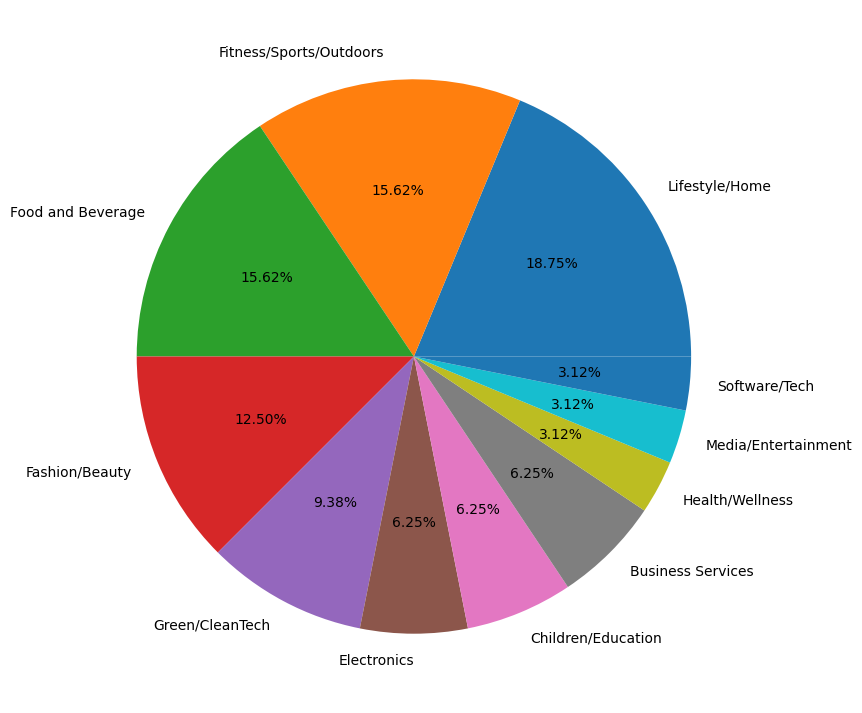

In [54]:
print("Total investments by Naomi", shark_tank[shark_tank['Naomi Investment Amount']>0][['Naomi Investment Amount']].count().to_string()[-3:])
print("Investment amount by Naomi", format_currency(shark_tank['Naomi Investment Amount'].sum(), 'AUD', locale='en_US').replace(".00", ""))
print("Equity received by Naomi", round(shark_tank['Naomi Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Naomi Investment Amount']>0][["Startup Name","Industry","Naomi Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nNaomi industry wise investments\n")
print(shark_tank[shark_tank['Naomi Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Naomi Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Naomi Investment Amount']>0] [["Startup Name","Naomi Investment Amount","Naomi Investment Equity"]].sort_values(by="Naomi Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Naomi Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎾 Glen's Investments

Total investments by Glen  27
Investment amount by Glen A$3,974,000
Equity received by Glen 652.67 % in different companies

Company details:
------------------------------------------------------------------------------------------
          Startup Name                Industry  Glen Investment Amount
        SharknadoAlive     Media/Entertainment             95000.00000
              Betswaps Fitness/Sports/Outdoors            100000.00000
             Rhinohide              Automotive             40000.00000
            PottyPlant       Business Services             70000.00000
         NewEyeCompany       Business Services             50000.00000
           Intelliweed         Green/CleanTech            175000.00000
             HitWithME Fitness/Sports/Outdoors             50000.00000
            SofiSpritz          Liquor/Alcohol             65000.00000
        GetKidsCooking      Children/Education            150000.00000
         LilFairyDoors      Children/Education           

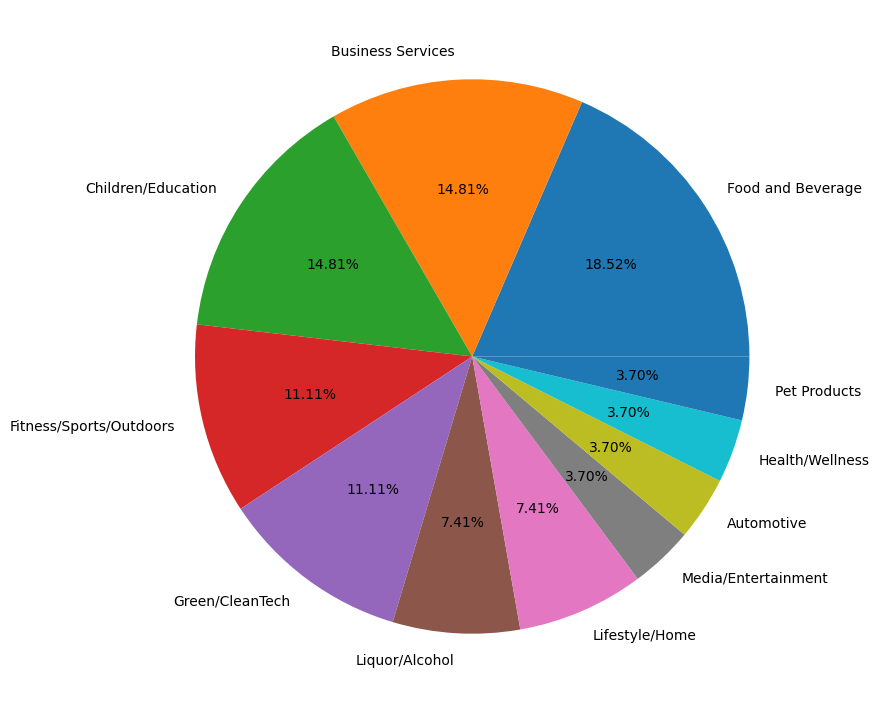

In [55]:
print("Total investments by Glen", shark_tank[shark_tank['Glen Investment Amount']>0][['Glen Investment Amount']].count().to_string()[-3:])
print("Investment amount by Glen", format_currency(shark_tank['Glen Investment Amount'].sum(), 'AUD', locale='en_US').replace(".00", ""))
print("Equity received by Glen", round(shark_tank['Glen Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Glen Investment Amount']>0][["Startup Name","Industry","Glen Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nGlen industry wise investments\n")
print(shark_tank[shark_tank['Glen Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Glen Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Glen Investment Amount']>0] [["Startup Name","Glen Investment Amount","Glen Investment Equity"]].sort_values(by="Glen Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Glen Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎆 All Guest's Investments

Total investments by all Guests 22
Investment amount by all Guests A$2,693,000
Equity received by all Guests 666.0 % in different companies

Company details:
--------------------------------------------------------------------------------------------
           Startup Name            Industry  Guest Investment Amount                          Invested Guest Name
         MobileTyreShop          Automotive                  75000.0                                         John
          SalsaRanchero   Food and Beverage                  80000.0                                         John
           Hummingbirds  Children/Education                  40000.0                                         John
            CharliChair  Children/Education                 200000.0                                         John
     GrownWoodenEyewear      Lifestyle/Home                  30000.0                                         John
                   Koja   Food and Beverage                 15000

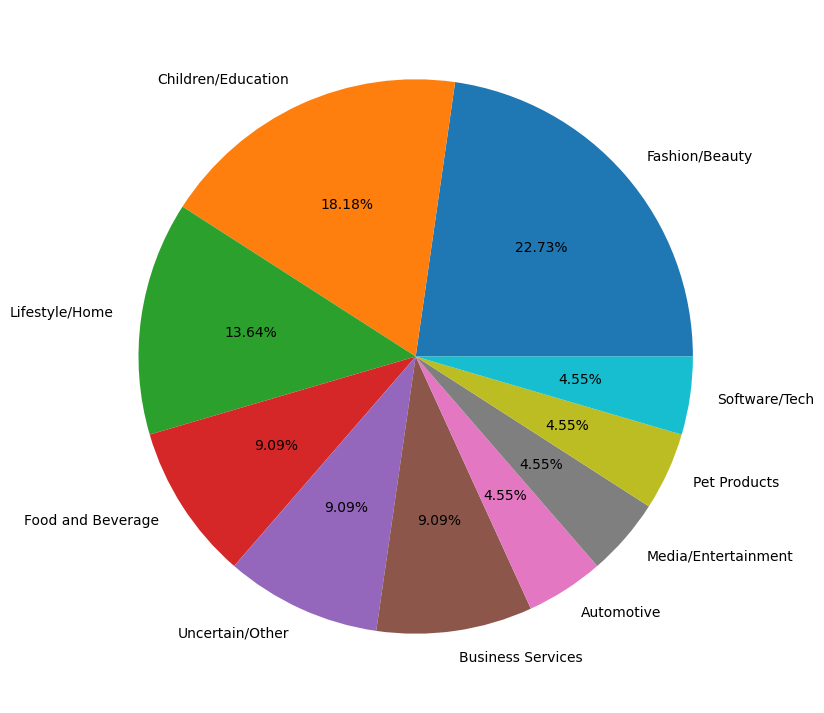

In [56]:
print("Total investments by all Guests", shark_tank[shark_tank['Guest Investment Amount']>0][['Guest Investment Amount']].count().to_string()[-2:])
print("Investment amount by all Guests", format_currency(shark_tank['Guest Investment Amount'].sum(), 'AUD', locale='en_US').replace(".00", ""))
print("Equity received by all Guests", round(shark_tank['Guest Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*92)
print(shark_tank.loc[shark_tank['Guest Investment Amount']>0][["Startup Name","Industry","Guest Investment Amount","Invested Guest Name"]].to_string(index=False))
print('-'*92)

print("\nAll Guests industry wise investments\n")
print(shark_tank[shark_tank['Guest Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Guest Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Guest Investment Amount']>0] [["Startup Name","Guest Investment Amount","Guest Investment Equity"]].sort_values(by="Guest Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Guest Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

In [57]:
# Guest sharks and number of companies they invested
shark_tank.loc[shark_tank['Guest Investment Amount'] > 1]['Invested Guest Name'].str.split(',').explode('Invested Guest Name').value_counts().sort_values(ascending=False)

Invested Guest Name
John               7
DavieFogarty       7
JaneLu             6
RobertHerjavec     6
CatrionaWallace    4
SabriSuby          3
Name: count, dtype: int64

In [58]:
# Investment amount by guests, in AUD
tmpdf = shark_tank.loc[shark_tank['Guest Investment Amount'] > 0][['Invested Guest Name','Guest Investment Amount']]
tmpdf['Number of Guests'] = tmpdf['Invested Guest Name'].str.count(',') + 1
tmpdf['Invetested Amount per Guest'] = tmpdf['Guest Investment Amount'] / tmpdf['Number of Guests']
tmpdf = tmpdf.set_index(tmpdf.columns.drop('Invested Guest Name',1).tolist())['Invested Guest Name'].str.split(',', expand=True).stack().reset_index().rename(columns={0:'Invested Guest Name'}).loc[:, tmpdf.columns]
round(tmpdf.groupby(["Invested Guest Name"])["Invetested Amount per Guest"].sum().sort_values(ascending=False))

Invested Guest Name
RobertHerjavec     687500.0
DavieFogarty       602500.0
John               595000.0
JaneLu             402500.0
SabriSuby          242500.0
CatrionaWallace    163000.0
Name: Invetested Amount per Guest, dtype: float64

Number of Sharks in Deal
1.0    82
2.0    38
3.0     5
5.0     1
4.0     1
Name: count, dtype: int64 

Number of Sharks in Deal
1.0    65%
2.0    30%
3.0     4%
5.0     1%
4.0     1%
Name: proportion, dtype: object


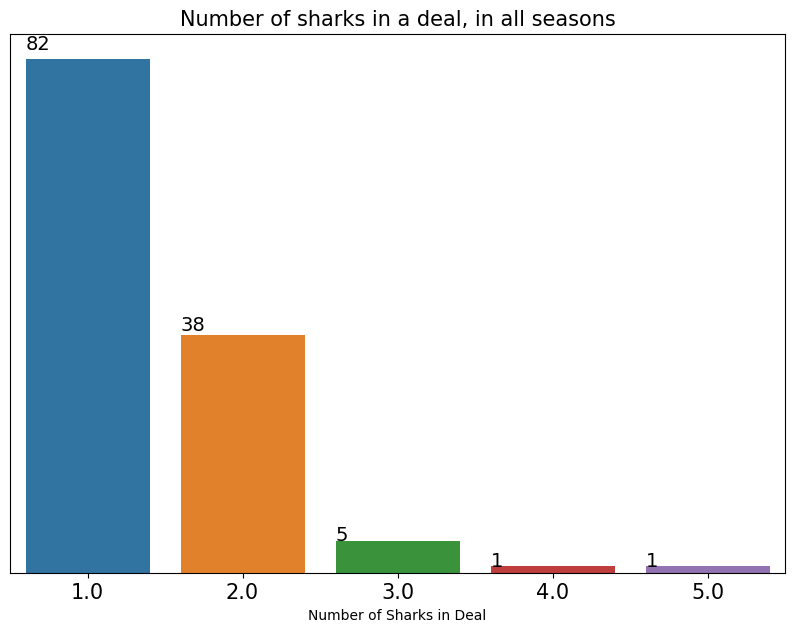

In [59]:
# Number of sharks in a deal, in all seasons
print(shark_tank['Number of Sharks in Deal'].value_counts(), "\n")

# In percentage
print(round(shark_tank['Number of Sharks in Deal'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

fig = plt.figure(figsize=(10, 7))
plt.title("Number of sharks in a deal, in all seasons", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks([])
ax = sns.countplot(data = shark_tank, x = 'Number of Sharks in Deal')
ax.set_ylabel('')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.02), size=14)

In [60]:
# All sharks deals
print(shark_tank.loc[shark_tank['Number of Sharks in Deal'] >= 5][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]])

    Season Number    Startup Name  Total Deal Amount  Total Deal Equity
65              2  SharknadoAlive           475000.0               50.0


In [61]:
# Sharks with most number of solo deals
amt_cols = shark_tank.columns[shark_tank.columns.str.contains(' Investment Amount')].tolist()
tmp = shark_tank.loc[shark_tank['Number of Sharks in Deal'] == 1][amt_cols]
tmp.count().sort_values(ascending=False).nlargest(3)

# Naomi did most number of solo deals, than any other Shark

Naomi Investment Amount     22
Janine Investment Amount    14
Glen Investment Amount      14
dtype: int64

In [62]:
# Sharks with most number of episode presence, in all seasons
present_cols = shark_tank.columns[shark_tank.columns.str.endswith(' Present')].tolist()
tmp = shark_tank[present_cols]
tmp.sum().sort_values(ascending=False).nlargest(5)

# Steve,Janine,Andrew,Naomi was there in most number of episodes

Steve Present     216.0
Janine Present    216.0
Andrew Present    216.0
Naomi Present     216.0
Glen Present      161.0
dtype: float64

In [63]:
# Top 25 Australia states of pitcher's
tmp = shark_tank['Pitchers State'].value_counts().nlargest(20).sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b>Top States</b> from where pitchers came from", template='simple_white', text=tmp, width=550, height=450)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [64]:
# Top 20 Australia cities
tmp = shark_tank['Pitchers City'].value_counts().nlargest(20).sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b>Top cities</b> with number of startups came for pitching", template='simple_white', text=tmp, width=750, height=600)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [65]:
# Most frequently asked amount, by startups
shark_tank.groupby('Original Ask Amount').size().nlargest(10)

# Original Ask Amount (AUD) and Number times asked

Original Ask Amount
200000    29
300000    20
50000     19
100000    18
250000    18
150000    12
80000     10
500000     9
60000      5
70000      5
dtype: int64

In [66]:
# Most frequently offered equity, by startups
shark_tank.groupby('Original Offered Equity').size().nlargest(10)

# Original Offered Equity (in %) and Number times offered

Original Offered Equity
20.0    66
10.0    64
15.0    22
25.0    20
5.0     13
30.0     9
40.0     6
12.0     4
7.5      3
50.0     3
dtype: int64

In [67]:
# ✅ Most frequently invested amount, by Sharks
shark_tank.groupby('Total Deal Amount').size().nlargest(10)

# Sharks mostly invested more than 100K-200K per deal

# Total Deal Amount (AUD) and Number times invested

Total Deal Amount
100000.0    16
200000.0    13
150000.0    12
300000.0     9
80000.0      8
50000.0      7
250000.0     7
120000.0     4
25000.0      3
40000.0      3
dtype: int64

In [68]:
# ✅ Most frequently received total equity, by Sharks
shark_tank.groupby('Total Deal Equity').size().nlargest(10)

# Sharks are expecting more than 25% equity, in a deal

# Total Deal Equity (in %) and Number times invested

Total Deal Equity
40.0    20
25.0    18
30.0    18
20.0    12
50.0     9
10.0     8
33.0     7
15.0     4
16.0     3
45.0     3
dtype: int64

In [69]:
# Most frequently asked amount, deals received % and not received %?
tmp2 = pd.crosstab(shark_tank['Original Ask Amount'], shark_tank['Received Offer']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=False)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(10)

# Most frequently asked Deal Amount (in AUD) and % of deal received and not received

,deal_percentage,no_deal_percentage
200000,66.0,34.0
100000,83.0,17.0
300000,70.0,30.0
150000,83.0,17.0
250000,56.0,44.0
50000,47.0,53.0
80000,60.0,40.0
120000,80.0,20.0
25000,100.0,0.0
500000,33.0,67.0


In [70]:
# Most frequently asked equity, deals received % and not received %?
tmp2 = pd.crosstab(shark_tank['Original Offered Equity'], shark_tank['Received Offer']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=False)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(10)

# Most frequently Offered Equity (in %) and % of deal received and not received

,deal_percentage,no_deal_percentage
10.0,80.0,20.0
20.0,62.0,38.0
15.0,64.0,36.0
25.0,50.0,50.0
5.0,69.0,31.0
40.0,67.0,33.0
30.0,33.0,67.0
7.5,67.0,33.0
8.0,100.0,0.0
12.0,50.0,50.0


In [71]:
# Mostly successful combinations (of asked amount and offered equity)
shark_tank.loc[shark_tank['Accepted Offer'] == 1].groupby(['Original Ask Amount','Original Offered Equity']).size().nlargest(10)

# If you are pitching in Australian Shark Tank, ask for 250K-300K with 10% equity ✅

Original Ask Amount  Original Offered Equity
100000               10.0                       7
                     20.0                       6
200000               20.0                       6
300000               10.0                       6
150000               10.0                       5
50000                20.0                       4
80000                20.0                       3
200000               5.0                        3
250000               10.0                       3
20000                10.0                       2
dtype: int64

In [72]:
# Most frequently asked amount, by startups who could NOT get a deal
shark_tank.loc[shark_tank['Received Offer'] == 0].groupby('Original Ask Amount').size().nlargest(10)

# Original Ask Amount (AUD) and Number times asked (but rejected by sharks) ❌

Original Ask Amount
50000      10
200000     10
250000      8
300000      6
500000      6
80000       4
70000       3
100000      3
1000000     3
60000       2
dtype: int64

In [73]:
# Most frequently offered equity, by startups who could NOT get a deal
shark_tank.loc[shark_tank['Received Offer'] == 0].groupby('Original Offered Equity').size().nlargest(10)

# Original Offered Equity (in %) and Number times offered (but rejected by sharks) ❌

Original Offered Equity
20.0    25
10.0    13
25.0    10
15.0     8
30.0     6
5.0      4
12.0     2
18.0     2
40.0     2
50.0     2
dtype: int64

In [74]:
# Mostly rejected combinations (of asked amount and offered equity)
shark_tank.loc[shark_tank['Received Offer'] == 0].groupby(['Original Ask Amount','Original Offered Equity']).size().nlargest(10)

# If you are pitching in Shark Tank US, don't ask for 100K with 10%/20% equity or 500K with 5% equity 🔴

Original Ask Amount  Original Offered Equity
50000                20.0                       4
                     10.0                       3
80000                20.0                       3
200000               20.0                       3
50000                25.0                       2
70000                20.0                       2
100000               15.0                       2
200000               10.0                       2
                     25.0                       2
250000               10.0                       2
dtype: int64

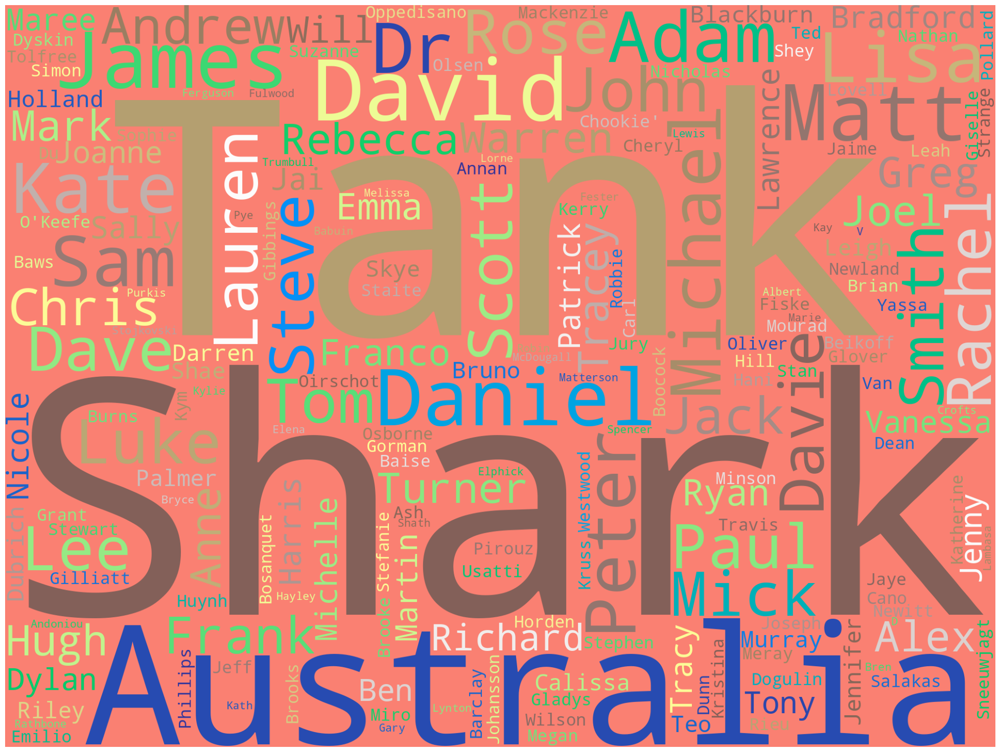

In [75]:
# Word cloud based on Pitcher name
text = " Shark Tank Australia ".join(cat for cat in shark_tank['Entrepreneur Names'].astype(str))
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='salmon', colormap='terrain_r', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [76]:
# Many (20) companies got more amount than they asked/expected
print(shark_tank.loc[shark_tank['Original Ask Amount'] < shark_tank["Total Deal Amount"]][["Startup Name"]].count())
shark_tank.loc[shark_tank['Original Ask Amount'] < shark_tank["Total Deal Amount"]][["Season Number","Startup Name","Original Ask Amount","Total Deal Amount"]]

Startup Name    22
dtype: int64


,Season Number,Startup Name,Original Ask Amount,Total Deal Amount
2,1,CaseBoards,20000,40000.0
3,1,Hamdog,1,2.0
18,1,SalsaRanchero,60000,80000.0
24,1,ScrubbaWashBag,178000,360000.0
38,1,TheDinnerLadies,140000,216000.0
46,1,FlyBabeeTravelMadeEasy,50000,80000.0
47,1,Three65Underwear,60000,120000.0
59,1,SonseeWoman,50000,100000.0
63,2,OnTheGoSports,300000,600000.0
80,2,BodyPeaceClothing,90000,180000.0


In [77]:
# Most of the companies diluted/gave their company equity more than they initially offered/expected
shark_tank.loc[shark_tank['Original Offered Equity'] < shark_tank["Total Deal Equity"]][["Season Number","Startup Name","Original Offered Equity","Total Deal Equity"]]

,Season Number,Startup Name,Original Offered Equity,Total Deal Equity
2,1,CaseBoards,10.0,35.0
3,1,Hamdog,25.0,50.0
4,1,EdibleBugShop,20.0,50.0
6,1,ThroatScope,10.0,30.0
18,1,SalsaRanchero,30.0,40.0
...,...,...,...,...
232,5,HolidayCelebrationTrees,15.0,30.0
233,5,Brandscent,10.0,25.0
234,5,GetDown,20.0,40.0
235,5,Fydoo,20.0,40.0


In [78]:
# Below (22) companies got the same valuation they requested (with or without loan)
print(shark_tank.loc[shark_tank['Valuation Requested'] == shark_tank["Deal Valuation"]][["Startup Name"]].count())
shark_tank.loc[shark_tank['Valuation Requested'] == shark_tank["Deal Valuation"]][["Season Number","Startup Name","Valuation Requested","Deal Valuation"]]

Startup Name    22
dtype: int64


,Season Number,Startup Name,Valuation Requested,Deal Valuation
0,1,CricketCooler,1400000,1400000.0
3,1,Hamdog,4,4.0
18,1,SalsaRanchero,200000,200000.0
55,1,HaloMedicalDevices,952381,952381.0
65,2,SharknadoAlive,950000,950000.0
67,2,CarNextDoor,7500000,7500000.0
74,2,Rhinohide,800000,800000.0
80,2,BodyPeaceClothing,600000,600000.0
81,2,FridayBeers,250000,250000.0
104,2,SofiSpritz,1300000,1300000.0


In [79]:
# There are 7 companies which got more valuation than they pitched
print(shark_tank.loc[shark_tank['Valuation Requested'] < shark_tank["Deal Valuation"]][["Startup Name"]].count())
shark_tank.loc[shark_tank['Valuation Requested'] < shark_tank["Deal Valuation"]][["Season Number","Startup Name","Valuation Requested","Deal Valuation"]]

Startup Name    7
dtype: int64


,Season Number,Startup Name,Valuation Requested,Deal Valuation
38,1,TheDinnerLadies,424242,654545.0
59,1,SonseeWoman,250000,500000.0
77,2,2Shu,375000,600000.0
82,2,CapHat,480000,1200000.0
110,2,LilFairyDoors,1625000,3250000.0
111,2,Vegepod,750000,1125000.0
216,5,BoringWithoutYou,180000,250000.0


In [80]:
# Episodes which got most Viewership
print("Maximum SharkTank viewership in AU:", shark_tank['Viewers'].max(), "\n")
print(shark_tank.loc[shark_tank['Viewers']>=shark_tank['Viewers'].max()-240000][["Season Number","Episode Number","Startup Name","Viewers"]].head(12).sort_values("Viewers",ascending=False).to_string(index=False))

Maximum SharkTank viewership in AU: 973000 

 Season Number  Episode Number           Startup Name  Viewers
             1               6         ScrubbaWashBag   973000
             1               6                  KLite   973000
             1               6               EvilCorp   973000
             1               6             Bottlepops   973000
             3               1              CancerAid   749000
             3               1             MiniClones   749000
             3               1               iRecruit   749000
             1               3               Surfsafe   739000
             1               3          CaptainActive   739000
             1               3         MobileTyreShop   739000
             1               3 SimplyMoreishMarinades   739000
             1               3                TouchCo   739000


In [81]:
# Episodes which got least Viewership
print("Minimum SharkTank viewership in AU:", shark_tank['Viewers'].min(), "\n")
print(shark_tank.loc[shark_tank['Viewers']<=shark_tank['Viewers'].min()+100000][["Season Number","Episode Number","Startup Name","Viewers"]].head(12).sort_values("Viewers").to_string(index=False))

Minimum SharkTank viewership in AU: 216000 

 Season Number  Episode Number     Startup Name  Viewers
             5               5          Mimi&Co   216000
             5               5     WuliGrooming   216000
             5               5           Mearth   216000
             5               4        AIToolkit   223000
             5               4          Kaasida   223000
             5               4       TheBeanies   223000
             5               1 BoringWithoutYou   237000
             5               1           Stryda   237000
             5               1      PunchingPro   237000
             5               3         FireHalo   261000
             5               3   tinyScienceLab   261000
             5               2           Pixxie   262000


Multiple Entrepreneurs
0    145
1     92
Name: count, dtype: Int64 

Multiple Entrepreneurs
0    61%
1    39%
Name: proportion, dtype: object


<Axes: ylabel='count'>

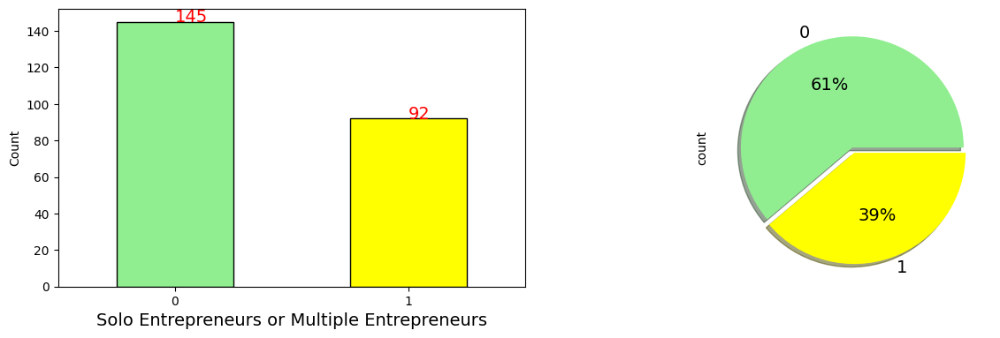

In [82]:
# Solo or multiple Entrepreneurs ?
print(shark_tank['Multiple Entrepreneurs'].value_counts(), "\n")
print(round(shark_tank['Multiple Entrepreneurs'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15,9))
ax1 = plt.subplot(221)
shark_tank["Multiple Entrepreneurs"].value_counts().plot(kind='bar', color=["lightgreen","yellow"], ec="k")
plt.xlabel("Solo Entrepreneurs or Multiple Entrepreneurs", size=14)
plt.ylabel("Count")
plt.xticks(rotation=0)
for x,y in enumerate(shark_tank["Multiple Entrepreneurs"].value_counts()):
    plt.annotate(y, (x,y), fontsize=14, color="red")
    
ax2 = plt.subplot(222)
shark_tank["Multiple Entrepreneurs"].value_counts().plot(kind='pie', autopct='%.0f%%', explode = (0,0.05), colors=["lightgreen","yellow"], shadow=True, fontsize=14)

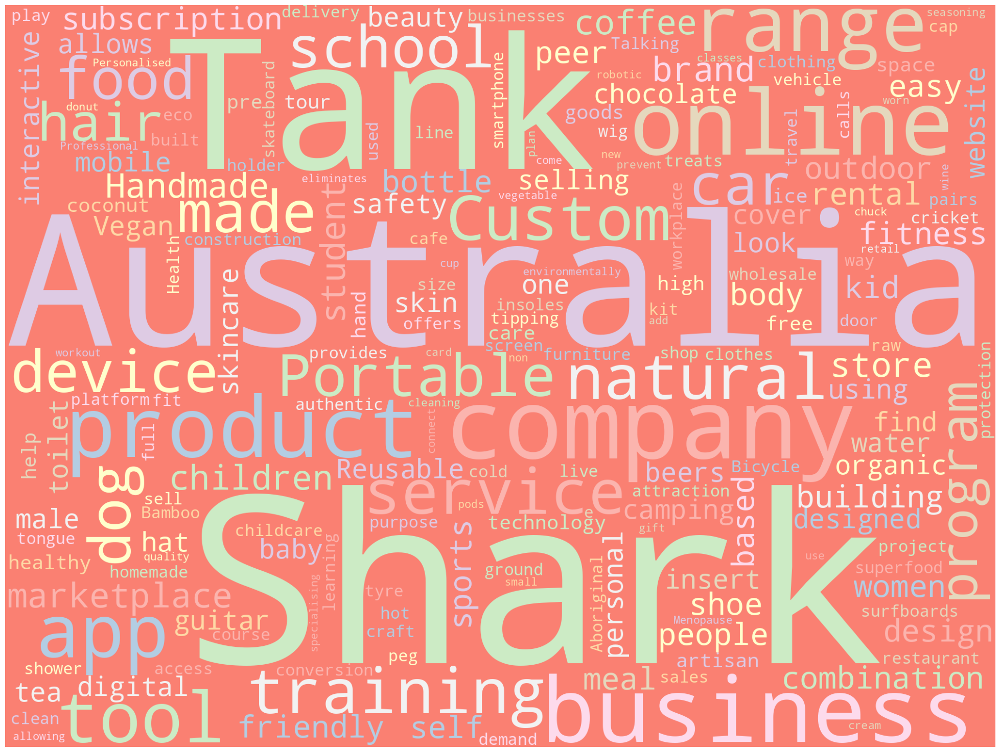

In [83]:
# Word cloud based on Business Description of startups came in all seasons
text = " Shark Tank Australia ".join(cat for cat in shark_tank.loc[shark_tank['Business Description'].notnull()]['Business Description'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='salmon', colormap='Pastel1', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [84]:
# Correlation matrix
shark_tank.corr(numeric_only=True).style.background_gradient(cmap = 'Blues')

,Season Number,Episode Number,Pitch Number,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,Investment Amount Per Shark,Equity Per Shark,Royalty Deal,Advisory Shares Equity,Loan,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions
Season Number,1.000000,-0.146473,0.973415,0.036993,-0.577433,-0.003832,-0.055060,0.030081,0.142443,0.069605,-0.005360,-0.085687,-0.003801,-0.004216,0.019911,-0.042463,nan,nan,0.134836,0.261630,-0.152712,-0.004663,-0.248838,0.134180,-0.122005,0.004528,0.262940,0.046500,0.183733,0.307638,0.159287,nan,nan,nan,nan,nan,1.000000,-0.005360
Episode Number,-0.146473,1.000000,0.079247,0.122224,-0.203578,-0.076459,0.006656,-0.103535,-0.051526,0.096836,-0.082817,0.106899,-0.129842,-0.149498,-0.077222,0.121370,nan,nan,-0.259341,0.035586,0.207075,0.103376,0.143796,-0.125197,0.222757,-0.193950,0.130793,0.131104,0.006543,0.121822,0.141027,nan,nan,nan,nan,nan,-0.421052,-0.082817
Pitch Number,0.973415,0.079247,1.000000,0.067214,-0.619616,-0.021274,-0.055257,0.006623,0.136873,0.092336,-0.016298,-0.069158,-0.025561,-0.039053,0.009513,-0.019483,nan,nan,0.068561,0.265236,-0.102547,0.025442,-0.219834,0.104966,-0.073116,-0.062738,0.301302,0.084950,0.186429,0.333796,0.189557,nan,nan,nan,nan,nan,0.986960,-0.016298
Multiple Entrepreneurs,0.036993,0.122224,0.067214,1.000000,-0.027233,-0.034942,-0.064463,0.046026,-0.025951,-0.042085,0.029756,-0.056487,0.105562,-0.104025,0.035767,-0.014797,nan,nan,0.177050,0.311007,-0.009015,0.301570,0.291133,-0.109036,0.110054,0.212284,-0.256691,0.358042,0.175690,0.017890,0.058152,nan,nan,nan,nan,nan,-0.105946,0.029756
Viewers,-0.577433,-0.203578,-0.619616,-0.027233,1.000000,0.057399,0.086689,0.022510,-0.119128,-0.066859,0.116434,-0.084976,0.113162,-0.050088,0.116281,-0.069440,nan,nan,-0.077371,-0.335242,0.034051,0.019113,0.144966,0.149631,-0.251357,0.162821,-0.313592,0.093561,-0.125476,-0.346078,-0.215381,nan,nan,nan,nan,nan,-0.874780,0.116434
Original Ask Amount,-0.003832,-0.076459,-0.021274,-0.034942,0.057399,1.000000,0.342257,0.657346,-0.170955,-0.239486,0.966174,-0.065238,0.806517,0.023139,0.947992,-0.064887,nan,nan,0.840243,0.688502,-0.007836,0.847926,0.103831,0.970404,0.000141,0.717614,-0.469278,0.743456,-0.219115,0.881627,-0.043251,nan,nan,nan,nan,nan,-0.077880,0.966174
Original Offered Equity,-0.055060,0.006656,-0.055257,-0.064463,0.086689,0.342257,1.000000,-0.213544,-0.207227,0.254540,-0.026739,0.435714,-0.231086,0.140092,-0.053350,0.301563,nan,nan,-0.074137,-0.240704,0.118178,0.151495,0.127445,-0.113929,0.210225,-0.413957,-0.043718,-0.067167,0.161368,-0.325522,0.339355,nan,nan,nan,nan,nan,-0.097892,-0.026739
Valuation Requested,0.030081,-0.103535,0.006623,0.046026,0.022510,0.657346,-0.213544,1.000000,-0.027349,-0.405404,0.856452,-0.264573,0.900634,-0.059912,0.857261,-0.185891,nan,nan,0.436211,0.675366,-0.268234,0.768600,0.004226,0.963998,-0.049130,0.749141,-0.411145,0.661203,-0.310713,0.669631,-0.038056,nan,nan,nan,nan,nan,-0.004845,0.856452
Received Offer,0.142443,-0.051526,0.136873,-0.025951,-0.119128,-0.170955,-0.207227,-0.027349,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.291552,nan
Accepted Offer,0.069605,0.096836,0.092336,-0.042085,-0.066859,-0.239486,0.254540,-0.405404,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.200082,nan


In [85]:
print("numpy version: {}". format(np.__version__))
print("pandas version: {}". format(pd.__version__))
import matplotlib
print("matplotlib version: {}". format(matplotlib. __version__))
print("seaborn version: {}". format(sns.__version__))
import plotly
print("plotly version: {}". format(plotly.__version__))

# Current Python package versions
# numpy version: 1.26.4
# pandas version: 2.2.1
# matplotlib version: 3.7.5
# seaborn version: 0.12.2
# plotly version: 5.18.0

numpy version: 1.26.4
pandas version: 2.2.2
matplotlib version: 3.7.5
seaborn version: 0.12.2
plotly version: 5.18.0


## Data set values verification (you can ignore below section)
##### below queries should not return any rows

In [86]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 1) & (shark_tank['Total Deal Amount'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [87]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 1) & (shark_tank['Total Deal Equity'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [88]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 1) & (shark_tank['Deal Valuation'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [89]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 1) & (shark_tank['Number of Sharks in Deal'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [90]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 1) & (shark_tank['Investment Amount Per Shark'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [91]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 1) & (shark_tank['Equity Per Shark'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [92]:
shark_tank.loc[round(shark_tank['Total Deal Amount'].fillna(0),1) != round(shark_tank['Steve Investment Amount'].fillna(0) + shark_tank['Janine Investment Amount'].fillna(0) + shark_tank['Andrew Investment Amount'].fillna(0) + shark_tank['Naomi Investment Amount'].fillna(0) + shark_tank['Glen Investment Amount'].fillna(0) + shark_tank['Guest Investment Amount'].fillna(0), 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [93]:
shark_tank.loc[round(shark_tank['Total Deal Equity'].fillna(0),1) != round(shark_tank['Steve Investment Equity'].fillna(0) + shark_tank['Janine Investment Equity'].fillna(0) + shark_tank['Andrew Investment Equity'].fillna(0) + shark_tank['Naomi Investment Equity'].fillna(0) + shark_tank['Glen Investment Equity'].fillna(0) + shark_tank['Guest Investment Equity'].fillna(0), 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [94]:
shark_tank.loc[(shark_tank['Guest Investment Amount'].notnull()) & (shark_tank['Invested Guest Name'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [95]:
shark_tank.loc[(shark_tank['Guest Investment Amount'].isnull()) & (shark_tank['Invested Guest Name'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [96]:
shark_tank.loc[(shark_tank['Multiple Entrepreneurs'] != 0) & (shark_tank['Multiple Entrepreneurs'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [97]:
shark_tank.loc[(shark_tank['Multiple Entrepreneurs'] == 0) & (shark_tank['Entrepreneur Names'].notnull() & shark_tank['Entrepreneur Names'].str.contains(' and'))]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [98]:
shark_tank.loc[(shark_tank['Multiple Entrepreneurs'] == 1) & (shark_tank['Entrepreneur Names'].str.contains(' & ')==False)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions
229,5,CinnamonCove,6,233,29-Aug-23,17-Oct-23,3-Oct-23,Fashion/Beauty,Swimwear brand for tweens,https://cinnamoncove.com.au/,Female,Young,NaN,NaN,Myla and Liv,1,279000,80000,30.0,266667,1,1.0,80000.0,33.0,242424.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80000.0,33.0,"DavieFogarty,CatrionaWallace",NaN,NaN,NaN,NaN,NaN,5.0,0.08
231,5,SockDrawerHeroes,7,237,29-Aug-23,17-Oct-23,10-Oct-23,Fashion/Beauty,Gender expression company,https://sockdrawerheroes.com/,Couple,Middle,Petersham,New South Wales,Erin and Bec,1,227000,120000,7.5,1600000,1,1.0,120000.0,16.0,750000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,120000.0,16.0,"JaneLu,CatrionaWallace",NaN,NaN,NaN,NaN,NaN,5.0,0.12


In [99]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 0) & (shark_tank['Total Deal Amount'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [100]:
shark_tank.loc[(shark_tank['Pitchers Gender'] == 'Mixed Team') & (shark_tank['Multiple Entrepreneurs'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [101]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 0) & (shark_tank['Invested Guest Name'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions


In [102]:
shark_tank.loc[shark_tank['Total Deal Amount'] < shark_tank["Loan"]]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Viewers,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Deal Valuation,...,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Mentorship,Steve Investment Amount,Steve Investment Equity,Janine Investment Amount,Janine Investment Equity,Andrew Investment Amount,Andrew Investment Equity,Naomi Investment Amount,Naomi Investment Equity,Glen Investment Amount,Glen Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Steve Present,Janine Present,Andrew Present,Naomi Present,Glen Present,Guest Present,Total Deal Amount in Millions
